-------

# Telecom Churn Prediction 

----

## 1. `Case Study Overview`
================================

The goal of this notebook is to provide an overview of how write a notebook and create a submission file that successfully solves the churn prediction problem. Please download the datasets, unzip and place them in the same folder as this notebook.

We are going to follow the process called CRISP-DM.

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/b/b9/CRISP-DM_Process_Diagram.png/639px-CRISP-DM_Process_Diagram.png" style="height: 400px; width:400px;"/>

After Business and Data Understanding via EDA, we want to prepare data for modelling. Then evaluate and submit our predictions.

# 0. Problem statement

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining high profitable customers is the number one business
goal. To reduce customer churn, telecom companies need to predict which customers are at high risk of churn. In this project, you will analyze customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn, and identify the main indicators of churn.

In this competition, your goal is *to build a machine learning model that is able to predict churning customers based on the features provided for their usage.*

**Customer behaviour during churn:**

Customers usually do not decide to switch to another competitor instantly, but rather over a
period of time (this is especially applicable to high-value customers). In churn prediction, we
assume that there are three phases of customer lifecycle :

1. <u>The ‘good’ phase:</u> In this phase, the customer is happy with the service and behaves as usual.

2. <u>The ‘action’ phase:</u> The customer experience starts to sore in this phase, for e.g. he/she gets a compelling offer from a competitor, faces unjust charges, becomes unhappy with service quality etc. In this phase, the customer usually shows different behaviour than the ‘good’ months. It is crucial to identify high-churn-risk customers in this phase, since some corrective actions can be taken at this point (such as matching the competitor’s offer/improving the service quality etc.)

3. <u>The ‘churn’ phase:</u> In this phase, the customer is said to have churned. In this case, since you are working over a four-month window, the first two months are the ‘good’ phase, the third month is the ‘action’ phase, while the fourth month (September) is the ‘churn’ phase.

## 2. `Data Exploration`
===========================

  + 2.1. [Load Libraries](#2.1-Load-Libraries:)
  + 2.2. [Load Data](#2.2-Load-Data:)
  + 2.2. [Data Dictionary](#2.2-Dictionary-Exploration:)
  + 2.3. [Dataset Exploration](#2.3-Dataset-Exploration:)

### <ins>[2](#2.-Explore-Data).1 Load Libraries:</ins>

Load relevant libraries at this section to ease the maintainance and tracking.

In [1]:
# import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import matplotlib.patches as patches
%matplotlib inline
import seaborn as sb
import traceback
import math
import datetime

### <ins>[2](#2.-Explore-Data).2 Load Data:</ins>

Import `data dictionary` to understand the variables:

In [2]:
# import data dictionary
try:
    info_df = pd.read_csv('data_dictionary.csv')
    print('Data Load: Successful')
except Exception:
    traceback.print_exc()
    print('Data Load: Failure')

Data Load: Successful


Import `Train` dataset:

In [3]:
# import data dictionary
try:
    train_df = pd.read_csv('train.csv', delimiter = ',')
    print('Data Load: Successful')
except Exception:
    traceback.print_exc()
    print('Data Load: Failure')

Data Load: Successful


### <ins>[2](#2.-Explore-Data).3 Understand Variables:</ins>

<ins> Visually inspect the `data dictionary` </ins>

In [4]:
info_df.style

,Acronyms,Description
0,CIRCLE_ID,Telecom circle area to which the customer belongs to
1,LOC,Local calls within same telecom circle
2,STD,STD calls outside the calling circle
3,IC,Incoming calls
4,OG,Outgoing calls
5,T2T,Operator T to T ie within same operator mobile to mobile
6,T2M,Operator T to other operator mobile
7,T2O,Operator T to other operator fixed line
8,T2F,Operator T to fixed lines of T
9,T2C,Operator T to its own call center


<ins> Visually inspect the `train` data </ins>

+ Check the shape of the csv file loaded as the dataframe:

In [5]:
train_df.shape

(69999, 172)

+ Diaplay the first 5 rows in the dataset:

In [6]:
train_df.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,...,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,31.277,87.009,...,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0,0
1,1,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,0.000,122.787,...,0,0,NaN,1.0,NaN,710,0.0,0.0,0.0,0
2,2,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,60.806,103.176,...,0,0,NaN,NaN,NaN,882,0.0,0.0,0.0,0
3,3,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,156.362,205.260,...,0,0,NaN,NaN,NaN,982,0.0,0.0,0.0,0
4,4,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,240.708,128.191,...,1,0,1.0,1.0,1.0,647,0.0,0.0,0.0,0


+ Display the bottom 5 rows in the dataset:

In [7]:
train_df.tail()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,...,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
69994,69994,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,15.760,410.924,...,1,0,NaN,1.0,1.0,221,0.00,0.00,0.00,0
69995,69995,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,160.083,289.129,...,0,0,NaN,NaN,NaN,712,0.00,0.00,0.00,0
69996,69996,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,372.088,258.374,...,0,0,NaN,NaN,NaN,879,0.00,0.00,0.00,0
69997,69997,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,238.575,245.414,...,0,0,1.0,1.0,1.0,277,664.25,1402.96,990.97,0
69998,69998,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,168.269,42.815,...,0,0,1.0,NaN,1.0,1876,0.00,0.00,0.00,0


+ List the columns in the data:

In [8]:
train_df.columns

Index(['id', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou',
       'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8',
       'arpu_6', 'arpu_7',
       ...
       'sachet_3g_7', 'sachet_3g_8', 'fb_user_6', 'fb_user_7', 'fb_user_8',
       'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'churn_probability'],
      dtype='object', length=172)

### <ins>[2](#2.-Explore-Data).3 Understand Dataset:</ins>

In [9]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Columns: 172 entries, id to churn_probability
dtypes: float64(135), int64(28), object(9)
memory usage: 91.9+ MB


In [10]:
def programmatic_assessment(df):
    '''
    Returns a dataframe with variables as null counts, duplicate counts, and descriptive statistics of each variable/column in the input dataframe.
    
    Input args:
    df = dataframe
    
    output args:
    df = dataframe tabulating statistics of each variable.
    '''
    cols = df.columns
    assess_df = pd.DataFrame()
    
    for i, col in enumerate(cols):
        assess_df.loc[i, 'variable'] = col
        assess_df.loc[i, 'datatype'] = df[col].dtype
        assess_df.loc[i, 'null_count'] = df[col].isna().sum()
        assess_df.loc[i, 'null_pcnt'] = (df[col].isna().sum()) / df.shape[0]
        assess_df.loc[i, 'duplicate_count'] = df[col].duplicated().sum()
        assess_df.loc[i, 'count'] = df[col].describe()['count']

        # tabulate descriptive statistics for numerical variable
        if df[col].dtype in ['int64', 'float64']:
            assess_df.loc[i, 'mean'] = df[col].describe()['mean']
            assess_df.loc[i, 'std'] = df[col].describe()['std']
            assess_df.loc[i, 'min'] = df[col].describe()['min']
            assess_df.loc[i, '25%'] = df[col].describe()['25%']
            assess_df.loc[i, '50%'] = df[col].describe()['50%']
            assess_df.loc[i, '75%'] = df[col].describe()['75%']
            assess_df.loc[i, 'max'] = df[col].describe()['max']
        
        # tabulate descriptive statistics for categorical variable
        elif df[col].dtype in ['O']:
            assess_df.loc[i, 'unique'] = df[col].describe()['unique']
            assess_df.loc[i, 'top'] = df[col].describe()['top']
            assess_df.loc[i, 'freq'] = df[col].describe()['freq']
    
    return assess_df


def highlight_positives(x, color):
    '''
    highlight values greater than 0 in the input column of the dataframe.
    
    input args:
    color: color of the text to be displayed.
    '''
    return np.where(x > 0, f"color: {color};", None)


def highlight_values(x, color, threshold):
    '''
    highlight values greater than 0 in the input column of the dataframe.
    
    input args:
    color: color of the text to be displayed.
    threshold: value greater than which displayed in the specified color.
    '''
    return np.where(x > threshold, f"color: {color}; background-color: lightyellow;", None)

In [11]:
assess_df = programmatic_assessment(train_df)
assess_df.style.apply(highlight_positives, color='red', axis=1, subset="null_count")  

,variable,datatype,null_count,null_pcnt,duplicate_count,count,mean,std,min,25%,50%,75%,max,unique,top,freq
0,id,int64,0.000000,0.000000,0.000000,69999.000000,34999.000000,20207.115084,0.000000,17499.500000,34999.000000,52498.500000,69998.000000,nan,nan,nan
1,circle_id,int64,0.000000,0.000000,69998.000000,69999.000000,109.000000,0.000000,109.000000,109.000000,109.000000,109.000000,109.000000,nan,nan,nan
2,loc_og_t2o_mou,float64,702.000000,0.010029,69997.000000,69297.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,nan,nan,nan
3,std_og_t2o_mou,float64,702.000000,0.010029,69997.000000,69297.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,nan,nan,nan
4,loc_ic_t2o_mou,float64,702.000000,0.010029,69997.000000,69297.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,nan,nan,nan
5,last_date_of_month_6,object,0.000000,0.000000,69998.000000,69999.000000,nan,nan,nan,nan,nan,nan,nan,1.000000,6/30/2014,69999.000000
6,last_date_of_month_7,object,399.000000,0.005700,69997.000000,69600.000000,nan,nan,nan,nan,nan,nan,nan,1.000000,7/31/2014,69600.000000
7,last_date_of_month_8,object,733.000000,0.010472,69997.000000,69266.000000,nan,nan,nan,nan,nan,nan,nan,1.000000,8/31/2014,69266.000000
8,arpu_6,float64,0.000000,0.000000,8384.000000,69999.000000,283.134365,334.213918,-2258.709000,93.581000,197.484000,370.791000,27731.088000,nan,nan,nan
9,arpu_7,float64,0.000000,0.000000,8574.000000,69999.000000,278.185912,344.366927,-1289.715000,86.714000,191.588000,365.369500,35145.834000,nan,nan,nan


Filter variables with `null_count` greater than zero, sort them by descending order, and highlight the null count in `red` color .

In [12]:
# filter variables with null_count greater than zero, sort them by descending order, and highlight the null count in red color 
assess_df[assess_df['null_count']>0].sort_values(by=['datatype', 'null_count'], 
                                                                ascending=False).style.apply(highlight_values, 
                                                                                             color='red',
                                                                                             threshold=0.7,
                                                                                             axis=1, 
                                                                                             subset="null_pcnt")

,variable,datatype,null_count,null_pcnt,duplicate_count,count,mean,std,min,25%,50%,75%,max,unique,top,freq
119,date_of_last_rech_data_6,object,52431.000000,0.749025,69968.000000,17568.000000,nan,nan,nan,nan,nan,nan,nan,30.000000,6/30/2014,1317.000000
120,date_of_last_rech_data_7,object,52134.000000,0.744782,69967.000000,17865.000000,nan,nan,nan,nan,nan,nan,nan,31.000000,7/31/2014,1282.000000
121,date_of_last_rech_data_8,object,51582.000000,0.736896,69967.000000,18417.000000,nan,nan,nan,nan,nan,nan,nan,31.000000,8/31/2014,1388.000000
115,date_of_last_rech_8,object,2461.000000,0.035158,69967.000000,67538.000000,nan,nan,nan,nan,nan,nan,nan,31.000000,8/31/2014,10324.000000
114,date_of_last_rech_7,object,1234.000000,0.017629,69967.000000,68765.000000,nan,nan,nan,nan,nan,nan,nan,31.000000,7/31/2014,12206.000000
113,date_of_last_rech_6,object,1101.000000,0.015729,69968.000000,68898.000000,nan,nan,nan,nan,nan,nan,nan,30.000000,6/30/2014,11880.000000
7,last_date_of_month_8,object,733.000000,0.010472,69997.000000,69266.000000,nan,nan,nan,nan,nan,nan,nan,1.000000,8/31/2014,69266.000000
6,last_date_of_month_7,object,399.000000,0.005700,69997.000000,69600.000000,nan,nan,nan,nan,nan,nan,nan,1.000000,7/31/2014,69600.000000
122,total_rech_data_6,float64,52431.000000,0.749025,69962.000000,17568.000000,2.467612,2.794610,1.000000,1.000000,1.000000,3.000000,61.000000,nan,nan,nan
125,max_rech_data_6,float64,52431.000000,0.749025,69951.000000,17568.000000,126.500000,109.352573,1.000000,25.000000,145.000000,177.000000,1555.000000,nan,nan,nan


However, the columns with null count are not dropped from the dataset as it could be a pattern on a time series. Impute with value `0` if appropriate.

----

### Exploratory Data Analysis

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [14]:
id_cols = ["id",'circle_id']

date_cols = ['last_date_of_month_6',
             'last_date_of_month_7',
             'last_date_of_month_8',
             'date_of_last_rech_6',
             'date_of_last_rech_7',
             'date_of_last_rech_8',
             'date_of_last_rech_data_6',
             'date_of_last_rech_data_7',
             'date_of_last_rech_data_8']


cat_cols =  ['night_pck_user_6',
             'night_pck_user_7',
             'night_pck_user_8',
             'fb_user_6',
             'fb_user_7',
             'fb_user_8'
            ]

len_rows, len_col = train_df.shape
num_cols = [column for column in train_df.columns if column not in id_cols + date_cols + cat_cols]

# print the number of columns in each list
print("#ID cols: %d\n#Date cols:%d\n#Numeric cols:%d\n#Category cols:%d" % (len(id_cols), len(date_cols), len(num_cols), len(cat_cols)))

# check if we have missed any column or not
assert len(id_cols) + len(date_cols) + len(num_cols) + len(cat_cols) == len_col

#ID cols: 2
#Date cols:9
#Numeric cols:155
#Category cols:6


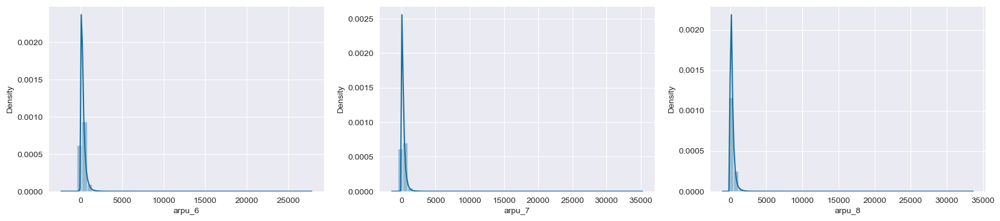

In [15]:
plt.figure(figsize=(20, 4))
sb.set_style("darkgrid")
sb.set_palette(palette = 'colorblind', n_colors = 10, desat = 0.8)
current_palette = sb.color_palette()

plt.subplot(1,3,1)
sns.distplot(train_df['arpu_6'])
plt.subplot(1,3,2)
sns.distplot(train_df['arpu_7'])
plt.subplot(1,3,3)
sns.distplot(train_df['arpu_8']);

The above plots depicts that the distribution of data is left skewed. Which is an indication that very less proportion of users have spent high average revenue while more users spent low average revenue.

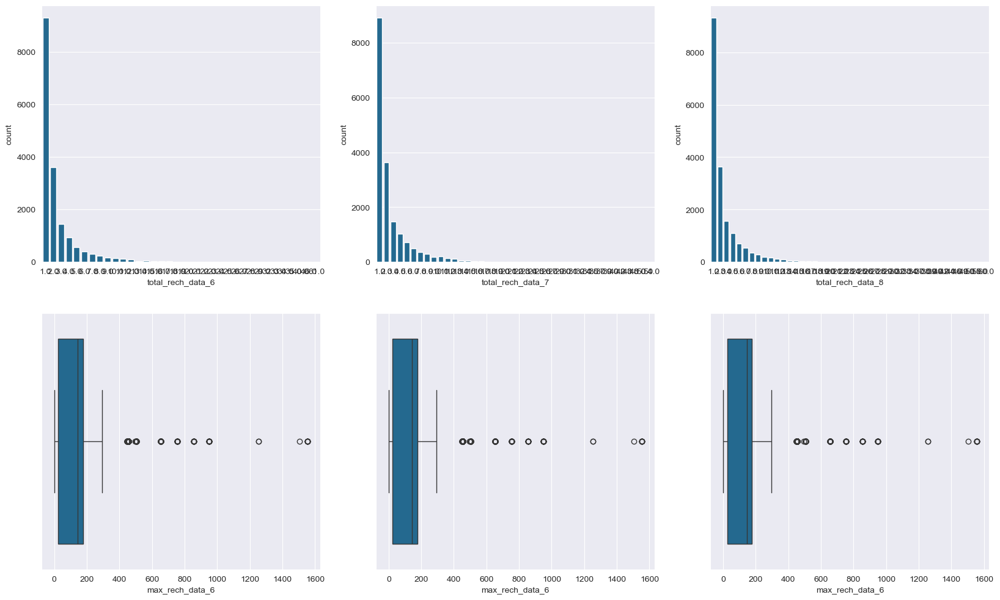

In [16]:
plt.figure(figsize=(20, 12))
sb.set_style("darkgrid")
sb.set_palette(palette = 'colorblind', n_colors = 10, desat = 0.8)
current_palette = sb.color_palette()

plt.subplot(2,3,1)
sns.countplot(x = 'total_rech_data_6', data = train_df)
plt.subplot(2,3,2)
sns.countplot(x = 'total_rech_data_7',  data = train_df)
plt.subplot(2,3,3)
sns.countplot(x = 'total_rech_data_8', data = train_df)
plt.subplot(2,3,4)
sns.boxplot(x = 'max_rech_data_6', data = train_df)
plt.subplot(2,3,5)
sns.boxplot(x = 'max_rech_data_6',  data = train_df)
plt.subplot(2,3,6)
sns.boxplot(x = 'max_rech_data_6', data = train_df)
plt.show();

The above plots depict that the Total reach data of month 6, 7 and 8 are right skewed and Max_reach_data of every month is having outliers

## Data Warangling:

Take a backup of the data prior to data manipulation:

In [17]:
telchurn = train_df.copy(deep=True)

### <ins> Handling Missing Values</ins>

In [18]:
telchurn.isnull().sum()*100/telchurn.shape[0]

id                   0.000000
circle_id            0.000000
loc_og_t2o_mou       1.002871
std_og_t2o_mou       1.002871
loc_ic_t2o_mou       1.002871
                       ...   
aon                  0.000000
aug_vbc_3g           0.000000
jul_vbc_3g           0.000000
jun_vbc_3g           0.000000
churn_probability    0.000000
Length: 172, dtype: float64

### <ins>Imputing missing values</ins>

In [19]:
# Imputing with zeroes
recharge_cols = ['total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8',
                 'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8',
                 'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8',
                 'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8',
                 'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8',
                 ]

telchurn[recharge_cols].describe(include='all')

,total_rech_data_6,total_rech_data_7,total_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8
count,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000
mean,2.467612,2.679989,2.652441,1.865323,2.056311,2.016018,0.602288,0.623678,0.636423,126.500000,126.402071,125.374925,192.831096,201.455940,196.815792
std,2.794610,3.073472,3.101265,2.566377,2.799916,2.728246,1.279297,1.401230,1.457058,109.352573,109.459266,109.648799,190.623115,198.346141,192.280532
min,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,25.000000,25.000000,25.000000,82.000000,92.000000,84.000000
50%,1.000000,2.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,145.000000,145.000000,145.000000,154.000000,154.000000,154.000000
75%,3.000000,3.000000,3.000000,2.000000,2.000000,2.000000,1.000000,1.000000,1.000000,177.000000,177.000000,179.000000,252.000000,252.000000,252.000000
max,61.000000,54.000000,60.000000,42.000000,48.000000,44.000000,29.000000,34.000000,45.000000,1555.000000,1555.000000,1555.000000,5920.000000,4365.000000,4076.000000


Explore `total_rech_data_6`,`date_of_last_rech_data_6` columns:

In [20]:
telchurn.loc[telchurn.total_rech_data_6.isnull() & telchurn.date_of_last_rech_data_6.isnull(),
             ["total_rech_data_6", "date_of_last_rech_data_6"]].head(10)

,total_rech_data_6,date_of_last_rech_data_6
0,NaN,NaN
1,NaN,NaN
2,NaN,NaN
3,NaN,NaN
5,NaN,NaN
6,NaN,NaN
8,NaN,NaN
9,NaN,NaN
11,NaN,NaN
12,NaN,NaN


Suppose a customer is not reacharging on a particular date of a month , then total_rech_data_ofmonth , date_of_last_rech_data_of month values remains empty

In [21]:
zero_impute = ['total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8',
               'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8', 
               'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8']

telchurn[zero_impute] = telchurn[zero_impute].apply(lambda x: x.fillna(0))

Validate the data imputation:

In [22]:
# Validate whether missing values are imputed correctly or not
print("Missing value ratio:\n")
print(telchurn[zero_impute].isnull().sum()*100/telchurn.shape[1])

Missing value ratio:

total_rech_data_6     0.0
total_rech_data_7     0.0
total_rech_data_8     0.0
av_rech_amt_data_6    0.0
av_rech_amt_data_7    0.0
av_rech_amt_data_8    0.0
max_rech_data_6       0.0
max_rech_data_7       0.0
max_rech_data_8       0.0
dtype: float64


In [23]:
# summary
print("\n\nSummary statistics:\n"+ '-'*20)
print(telchurn[zero_impute].describe(include='all'))



Summary statistics:
--------------------
       total_rech_data_6  total_rech_data_7  total_rech_data_8  \
count       69999.000000       69999.000000       69999.000000   
mean            0.619309           0.683981           0.697867   
std             1.762010           1.943193           1.973434   
min             0.000000           0.000000           0.000000   
25%             0.000000           0.000000           0.000000   
50%             0.000000           0.000000           0.000000   
75%             1.000000           1.000000           1.000000   
max            61.000000          54.000000          60.000000   

       av_rech_amt_data_6  av_rech_amt_data_7  av_rech_amt_data_8  \
count        69999.000000        69999.000000        69999.000000   
mean            48.395787           51.415168           51.782975   
std            126.923180          133.246541          131.291162   
min              0.000000            0.000000            0.000000   
25%              

In [24]:
print("Shape before dropping: ", telchurn.shape)
telchurn = telchurn.drop(id_cols + date_cols, axis=1)
print("Shape after dropping: ", telchurn.shape)

Shape before dropping:  (69999, 172)
Shape after dropping:  (69999, 161)


### <ins>Imputing missing values in categorical variables:</ins>

In [25]:
telchurn[cat_cols] = telchurn[cat_cols].apply(lambda x: x.fillna(-1))

In [26]:
print("Missing value ratio:\n")
print(telchurn[cat_cols].isnull().sum()*100/telchurn.shape[0])

Missing value ratio:

night_pck_user_6    0.0
night_pck_user_7    0.0
night_pck_user_8    0.0
fb_user_6           0.0
fb_user_7           0.0
fb_user_8           0.0
dtype: float64


### <ins>Drop variables based on threshold of missing values:</ins>

In [27]:
initial_cols = telchurn.shape[1]

MISSING_THRESHOLD = 0.7

include_cols = list(telchurn.apply(lambda column: True if column.isnull().sum()/telchurn.shape[0] < MISSING_THRESHOLD else False))

drop_missing = pd.DataFrame({'features':telchurn.columns , 'include': include_cols})
drop_missing.loc[drop_missing.include == True,:]

,features,include
0,loc_og_t2o_mou,True
1,std_og_t2o_mou,True
2,loc_ic_t2o_mou,True
3,arpu_6,True
4,arpu_7,True
...,...,...
156,aon,True
157,aug_vbc_3g,True
158,jul_vbc_3g,True
159,jun_vbc_3g,True


Check for the count of variables dropped from the analysis:

In [28]:
telchurn = telchurn.loc[:, include_cols]

dropped_cols = telchurn.shape[1] - initial_cols
print("{0} columns dropped.".format(dropped_cols))## iv) imputing using MICE

-12 columns dropped.


Iterate the process:

In [29]:
telchurn.isna().any()

loc_og_t2o_mou        True
std_og_t2o_mou        True
loc_ic_t2o_mou        True
arpu_6               False
arpu_7               False
                     ...  
aon                  False
aug_vbc_3g           False
jul_vbc_3g           False
jun_vbc_3g           False
churn_probability    False
Length: 149, dtype: bool

In [30]:
telchurn.std()

loc_og_t2o_mou         0.000000
std_og_t2o_mou         0.000000
loc_ic_t2o_mou         0.000000
arpu_6               334.213918
arpu_7               344.366927
                        ...    
aon                  952.426321
aug_vbc_3g           269.328659
jul_vbc_3g           267.899034
jun_vbc_3g           257.226810
churn_probability      0.302502
Length: 149, dtype: float64

In [31]:
same_val_col = ["loc_og_t2o_mou","std_og_t2o_mou","loc_ic_t2o_mou"]
telchurn = telchurn.drop(same_val_col, axis=1)

In [32]:
telchurn.isna().any()

arpu_6               False
arpu_7               False
arpu_8               False
onnet_mou_6           True
onnet_mou_7           True
                     ...  
aon                  False
aug_vbc_3g           False
jul_vbc_3g           False
jun_vbc_3g           False
churn_probability    False
Length: 146, dtype: bool

In [33]:
nan_list = telchurn.columns[telchurn.isna().any()].tolist()

In [34]:
for i in nan_list:    
    telchurn[i] = telchurn[i].fillna(0)

In [35]:
telchurn.columns[telchurn.isna().any()].tolist()

[]

In [36]:
print(telchurn.isnull().sum()*100/telchurn.shape[0])

arpu_6               0.0
arpu_7               0.0
arpu_8               0.0
onnet_mou_6          0.0
onnet_mou_7          0.0
                    ... 
aon                  0.0
aug_vbc_3g           0.0
jul_vbc_3g           0.0
jun_vbc_3g           0.0
churn_probability    0.0
Length: 146, dtype: float64


------

## Data Trasformation:

Categorize the customers into `High value customers` and `generic` based on the revenue/value generation. Calculation based on the past data which is for the month of june and july.

Formula to calculate `total data recharge amount` = `number of recharges` * `avg recharge amount`

In [37]:
telchurn['total_data_rech_6'] = telchurn.total_rech_data_6 * telchurn.av_rech_amt_data_6
telchurn['total_data_rech_7'] = telchurn.total_rech_data_7 * telchurn.av_rech_amt_data_7

To find the `total amount spent by the customer` for recharge for a particular month =  `total data recharge` + `total recharge` 

In [38]:
# calculate total recharge amount for June and July --> call recharge amount + data recharge amount
telchurn['amt_data_6'] = telchurn.total_rech_amt_6 + telchurn.total_data_rech_6
telchurn['amt_data_7'] = telchurn.total_rech_amt_7 + telchurn.total_data_rech_7

In [39]:
# calculate average recharge done by customer in June and July
telchurn['av_amt_data_6_7'] = (telchurn.amt_data_6 + telchurn.amt_data_7)/2

Here high value customers are treated as those who spent greater than the 70 percentile, choise can be 80 percentile also

In [40]:
# look at the 70th percentile recharge amount
print("Recharge amount at 70th percentile: {0}".format(telchurn.av_amt_data_6_7.quantile(0.7)))

Recharge amount at 70th percentile: 477.5


In [41]:
# retain only those customers who have recharged their mobiles with more than or equal to 70th percentile amount
telchurn_churn_filtered = telchurn.loc[telchurn.av_amt_data_6_7 >= telchurn.av_amt_data_6_7.quantile(0.7), :]
telchurn_churn_filtered = telchurn_churn_filtered.reset_index(drop=True)
telchurn_churn_filtered.shape

(21013, 151)

In [42]:
# delete variables created to filter high-value customers
telchurn_churn_filtered = telchurn_churn_filtered.drop(['total_data_rech_6', 'total_data_rech_7',
                                                        'amt_data_6', 'amt_data_7', 'av_amt_data_6_7'], axis=1)
telchurn_churn_filtered.shape

(21013, 146)

21013 rows reamins after selecting the customers who have provided recharge value of more than or equal to the recharge value of the 70th percentile customer.

### Calculating the difference between the 8th month and the average of the 6th and 7 th month

In [43]:
telchurn_churn_filtered['arpu_diff'] = telchurn_churn_filtered.arpu_8 - ((telchurn_churn_filtered.arpu_6 + telchurn_churn_filtered.arpu_7)/2)
telchurn_churn_filtered['onnet_mou_diff'] = telchurn_churn_filtered.onnet_mou_8 - ((telchurn_churn_filtered.onnet_mou_6 + telchurn_churn_filtered.onnet_mou_7)/2)
telchurn_churn_filtered['offnet_mou_diff'] = telchurn_churn_filtered.offnet_mou_8 - ((telchurn_churn_filtered.offnet_mou_6 + telchurn_churn_filtered.offnet_mou_7)/2)
telchurn_churn_filtered['roam_ic_mou_diff'] = telchurn_churn_filtered.roam_ic_mou_8 - ((telchurn_churn_filtered.roam_ic_mou_6 + telchurn_churn_filtered.roam_ic_mou_7)/2)
telchurn_churn_filtered['roam_og_mou_diff'] = telchurn_churn_filtered.roam_og_mou_8 - ((telchurn_churn_filtered.roam_og_mou_6 + telchurn_churn_filtered.roam_og_mou_7)/2)
telchurn_churn_filtered['loc_og_mou_diff'] = telchurn_churn_filtered.loc_og_mou_8 - ((telchurn_churn_filtered.loc_og_mou_6 + telchurn_churn_filtered.loc_og_mou_7)/2)
telchurn_churn_filtered['std_og_mou_diff'] = telchurn_churn_filtered.std_og_mou_8 - ((telchurn_churn_filtered.std_og_mou_6 + telchurn_churn_filtered.std_og_mou_7)/2)
telchurn_churn_filtered['isd_og_mou_diff'] = telchurn_churn_filtered.isd_og_mou_8 - ((telchurn_churn_filtered.isd_og_mou_6 + telchurn_churn_filtered.isd_og_mou_7)/2)
telchurn_churn_filtered['spl_og_mou_diff'] = telchurn_churn_filtered.spl_og_mou_8 - ((telchurn_churn_filtered.spl_og_mou_6 + telchurn_churn_filtered.spl_og_mou_7)/2)
telchurn_churn_filtered['total_og_mou_diff'] = telchurn_churn_filtered.total_og_mou_8 - ((telchurn_churn_filtered.total_og_mou_6 + telchurn_churn_filtered.total_og_mou_7)/2)
telchurn_churn_filtered['loc_ic_mou_diff'] = telchurn_churn_filtered.loc_ic_mou_8 - ((telchurn_churn_filtered.loc_ic_mou_6 + telchurn_churn_filtered.loc_ic_mou_7)/2)
telchurn_churn_filtered['std_ic_mou_diff'] = telchurn_churn_filtered.std_ic_mou_8 - ((telchurn_churn_filtered.std_ic_mou_6 + telchurn_churn_filtered.std_ic_mou_7)/2)
telchurn_churn_filtered['isd_ic_mou_diff'] = telchurn_churn_filtered.isd_ic_mou_8 - ((telchurn_churn_filtered.isd_ic_mou_6 + telchurn_churn_filtered.isd_ic_mou_7)/2)
telchurn_churn_filtered['spl_ic_mou_diff'] = telchurn_churn_filtered.spl_ic_mou_8 - ((telchurn_churn_filtered.spl_ic_mou_6 + telchurn_churn_filtered.spl_ic_mou_7)/2)
telchurn_churn_filtered['total_ic_mou_diff'] = telchurn_churn_filtered.total_ic_mou_8 - ((telchurn_churn_filtered.total_ic_mou_6 + telchurn_churn_filtered.total_ic_mou_7)/2)
telchurn_churn_filtered['total_rech_num_diff'] = telchurn_churn_filtered.total_rech_num_8 - ((telchurn_churn_filtered.total_rech_num_6 + telchurn_churn_filtered.total_rech_num_7)/2)
telchurn_churn_filtered['total_rech_amt_diff'] = telchurn_churn_filtered.total_rech_amt_8 - ((telchurn_churn_filtered.total_rech_amt_6 + telchurn_churn_filtered.total_rech_amt_7)/2)
telchurn_churn_filtered['max_rech_amt_diff'] = telchurn_churn_filtered.max_rech_amt_8 - ((telchurn_churn_filtered.max_rech_amt_6 + telchurn_churn_filtered.max_rech_amt_7)/2)
telchurn_churn_filtered['total_rech_data_diff'] = telchurn_churn_filtered.total_rech_data_8 - ((telchurn_churn_filtered.total_rech_data_6 + telchurn_churn_filtered.total_rech_data_7)/2)
telchurn_churn_filtered['max_rech_data_diff'] = telchurn_churn_filtered.max_rech_data_8 - ((telchurn_churn_filtered.max_rech_data_6 + telchurn_churn_filtered.max_rech_data_7)/2)
telchurn_churn_filtered['av_rech_amt_data_diff'] = telchurn_churn_filtered.av_rech_amt_data_8 - ((telchurn_churn_filtered.av_rech_amt_data_6 + telchurn_churn_filtered.av_rech_amt_data_7)/2)
telchurn_churn_filtered['vol_2g_mb_diff'] = telchurn_churn_filtered.vol_2g_mb_8 - ((telchurn_churn_filtered.vol_2g_mb_6 + telchurn_churn_filtered.vol_2g_mb_7)/2)
telchurn_churn_filtered['vol_3g_mb_diff'] = telchurn_churn_filtered.vol_3g_mb_8 - ((telchurn_churn_filtered.vol_3g_mb_6 + telchurn_churn_filtered.vol_3g_mb_7)/2)

In [44]:
# summary of one of the difference variables
telchurn_churn_filtered['max_rech_amt_diff'].describe()

count    21013.000000
mean       -10.423048
std        132.730444
min      -1901.000000
25%        -33.000000
50%          0.000000
75%         25.000000
max       3949.000000
Name: max_rech_amt_diff, dtype: float64

In [45]:
cat_cols

['night_pck_user_6',
 'night_pck_user_7',
 'night_pck_user_8',
 'fb_user_6',
 'fb_user_7',
 'fb_user_8']

In [46]:
num_cols = [column for column in telchurn_churn_filtered.columns if column not in cat_cols]
len(num_cols)

163

----

## Univariate Analysis:

In [47]:
def data_type(variable):
    if variable.dtype == np.int64 or variable.dtype == np.float64:
        return 'numerical'
    elif variable.dtype == 'category':
        return 'categorical'
    
def univariate(variable, stats=True):
    if data_type(variable) == 'numerical':
        sns.distplot(variable)
        if stats == True:
            print(variable.describe())
    elif data_type(variable) == 'categorical':
        sns.countplot(variable)
        if stats == True:
            print(variable.value_counts())
    else:
        print("Invalid variable passed: either pass a numeric variable or a categorical vairable.")

count    69999.000000
mean       283.134365
std        334.213918
min      -2258.709000
25%         93.581000
50%        197.484000
75%        370.791000
max      27731.088000
Name: arpu_6, dtype: float64


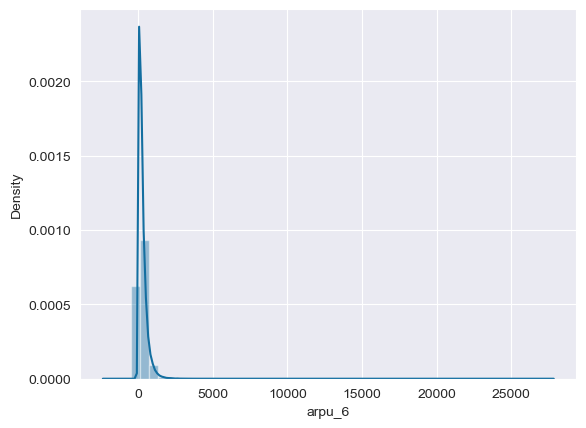

In [48]:
univariate(telchurn.arpu_6)

count    69999.000000
mean       278.185912
std        344.366927
min      -1289.715000
25%         86.714000
50%        191.588000
75%        365.369500
max      35145.834000
Name: arpu_7, dtype: float64


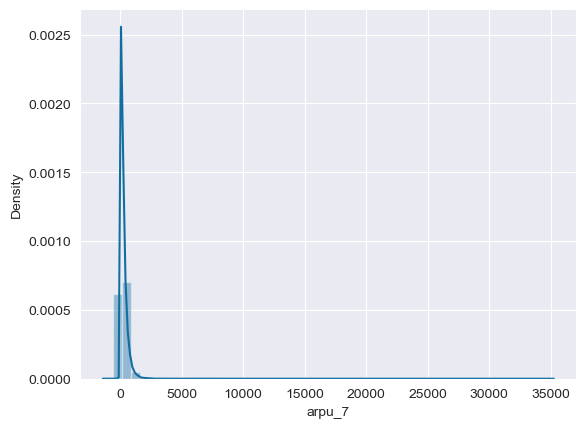

In [49]:
univariate(telchurn.arpu_7)

count    69999.000000
mean       278.858826
std        351.924315
min       -945.808000
25%         84.095000
50%        192.234000
75%        369.909000
max      33543.624000
Name: arpu_8, dtype: float64


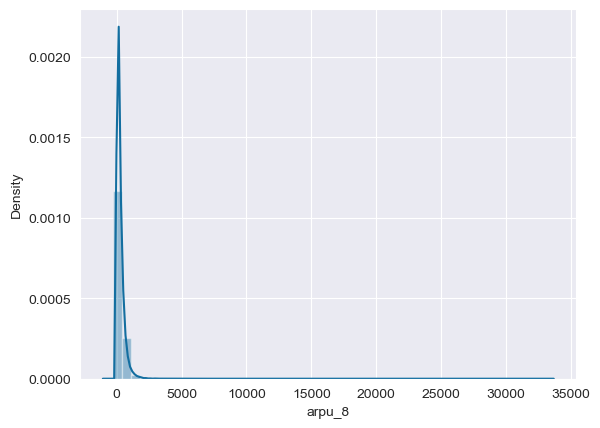

In [50]:
univariate(telchurn.arpu_8)

count    69999.000000
mean       125.943607
std        304.990552
min          0.000000
25%          4.110000
50%         27.840000
75%        106.280000
max      10752.560000
Name: onnet_mou_8, dtype: float64


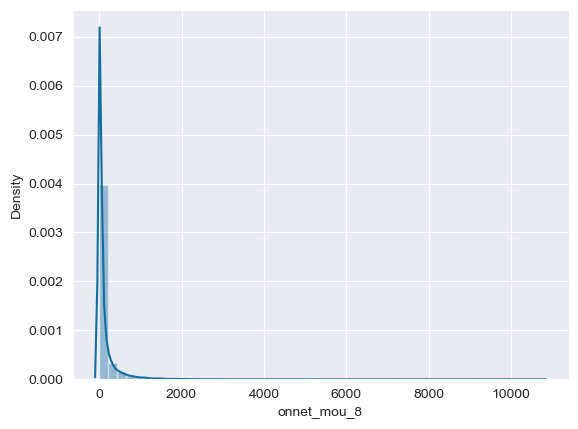

In [51]:
univariate(telchurn.onnet_mou_8)

## Bivariate Analysis:

In [52]:
def bivariate(var1, var2):
    if data_type(var1) == 'numerical' and data_type(var2) == 'numerical':
        sns.regplot(var1, var2)
    elif (data_type(var1) == 'categorical' and data_type(var2) == 'numerical') or (data_type(var1) == 'numerical' and data_type(var2) == 'categorical'):        
        sns.boxplot(var1, var2)

In [53]:
telchurn_churn_filtered.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,...,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
0,240.708,128.191,101.565,21.28,4.83,6.13,56.99,38.11,9.63,53.64,...,0.000,12.860,-3.5,-91.0,-15.5,-1.0,-8.0,-41.0,-136.375,0.00
1,580.549,377.294,338.286,10.43,24.99,194.43,317.11,341.79,197.09,0.00,...,0.000,124.655,0.0,125.0,0.0,0.5,77.0,77.0,224.140,0.00
2,1130.948,905.506,479.762,859.53,372.71,0.89,293.46,450.11,386.91,0.00,...,-0.065,-320.160,-12.5,-711.0,34.0,0.0,0.0,0.0,0.000,0.00
3,371.974,352.069,240.449,93.18,38.29,29.86,531.19,507.76,222.03,0.00,...,0.000,0.080,3.0,-193.5,-80.0,-0.5,0.0,-11.5,-0.020,0.00
4,390.489,350.985,421.300,8.58,11.48,12.68,133.16,158.73,182.83,0.00,...,0.000,26.105,-6.5,-318.5,-13.0,0.0,11.0,-40.5,-38.920,1017.89


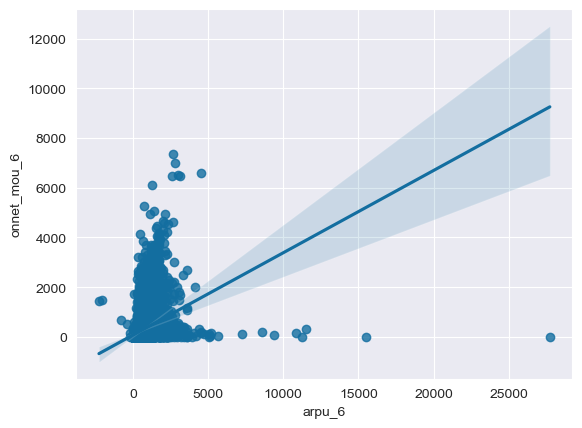

In [54]:
def bivariate(var1, var2):
  """
  This function creates a scatter plot using Seaborn's regplot function.

  Args:
      var1: The first data column (x-axis).
      var2: The second data column (y-axis).

  Returns:
      None
  """
  sns.regplot(x=var1, y=var2)

# Call the function with column names
bivariate(telchurn_churn_filtered['arpu_6'], telchurn_churn_filtered['onnet_mou_6'])


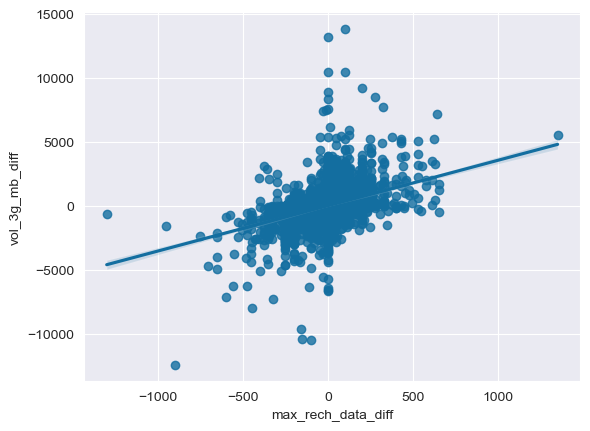

In [55]:
bivariate(telchurn_churn_filtered.max_rech_data_diff, telchurn_churn_filtered.vol_3g_mb_diff)

In [56]:
pd.crosstab(telchurn_churn_filtered.night_pck_user_8, telchurn_churn_filtered.sachet_3g_8)

sachet_3g_8,0,1,2,3,4,5,6,7,8,9,...,18,19,20,21,23,25,29,30,38,41
night_pck_user_8,,,,,,,,,,,,,,,,,,,,,
-1.0,9833,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0.0,9219,1117,264,118,60,48,25,19,17,10,...,3,1,3,1,1,0,1,0,1,1
1.0,84,60,18,20,9,14,4,5,5,4,...,0,0,0,1,1,1,0,1,0,0


### <ins>Cap outliers in all numeric variables with k-sigma technique</ins>

In [57]:
def cap_outliers(array, k=3):
    upper_limit = array.mean() + k*array.std()
    lower_limit = array.mean() - k*array.std()
    array[array<lower_limit] = lower_limit
    array[array>upper_limit] = upper_limit
    return array

In [58]:
sample_array = list(range(100))

# add outliers to the data
sample_array[0] = -9999
sample_array[99] = 9999

# cap outliers
sample_array = np.array(sample_array)
print("Array after capping outliers: \n", cap_outliers(sample_array, k=2))

Array after capping outliers: 
 [-2780     1     2     3     4     5     6     7     8     9    10    11
    12    13    14    15    16    17    18    19    20    21    22    23
    24    25    26    27    28    29    30    31    32    33    34    35
    36    37    38    39    40    41    42    43    44    45    46    47
    48    49    50    51    52    53    54    55    56    57    58    59
    60    61    62    63    64    65    66    67    68    69    70    71
    72    73    74    75    76    77    78    79    80    81    82    83
    84    85    86    87    88    89    90    91    92    93    94    95
    96    97    98  2877]


In [59]:
# cap outliers in the numeric columns
telchurn_churn_filtered[num_cols] = telchurn_churn_filtered[num_cols].apply(cap_outliers, axis=0)

## Multivariate Ananlysis:

In [60]:
telchurn_numeric = telchurn_churn_filtered[num_cols]
telchurn_numeric

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,...,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
0,240.708,128.191,101.565,21.28,4.83,6.13,56.99,38.11,9.63,53.64,...,0.000,12.860,-3.5,-91.0,-15.500000,-1.0,-8.0,-41.0,-136.375,0.000
1,580.549,377.294,338.286,10.43,24.99,194.43,317.11,341.79,197.09,0.00,...,0.000,124.655,0.0,125.0,0.000000,0.5,77.0,77.0,224.140,0.000
2,1130.948,905.506,479.762,859.53,372.71,0.89,293.46,450.11,386.91,0.00,...,-0.065,-320.160,-12.5,-711.0,34.000000,0.0,0.0,0.0,0.000,0.000
3,371.974,352.069,240.449,93.18,38.29,29.86,531.19,507.76,222.03,0.00,...,0.000,0.080,3.0,-193.5,-80.000000,-0.5,0.0,-11.5,-0.020,0.000
4,390.489,350.985,421.300,8.58,11.48,12.68,133.16,158.73,182.83,0.00,...,0.000,26.105,-6.5,-318.5,-13.000000,0.0,11.0,-40.5,-38.920,1017.890
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21008,1106.130,1609.381,1686.392,84.91,133.44,178.08,823.86,645.89,703.19,0.00,...,0.000,9.810,-1.0,552.0,387.768284,-1.5,-76.0,-224.5,-0.360,-422.745
21009,196.695,298.645,192.440,1.05,0.00,5.83,44.74,32.16,30.93,0.00,...,-0.095,-4.695,-2.0,-111.0,-14.000000,-1.5,0.0,-74.0,-0.180,-127.775
21010,235.524,195.633,129.598,45.08,94.31,8.34,111.51,236.61,91.54,0.00,...,0.000,-97.955,-4.0,-91.5,-0.500000,-5.5,-87.0,-180.5,-1.940,-312.295
21011,15.760,410.924,329.136,0.00,7.36,10.93,0.00,488.46,381.64,14.96,...,0.000,158.565,4.0,288.5,50.000000,-2.5,4.5,-50.5,22.015,0.000


In [61]:
# Correlation matrix
cor = telchurn_numeric.corr()
cor

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,...,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
arpu_6,1.000000,0.586362,0.501452,0.430119,0.279857,0.248881,0.597043,0.391466,0.345670,0.161524,...,-0.020918,-0.118421,-0.214080,-0.281766,-0.044233,0.048640,-0.004060,-0.002464,0.025108,-0.045151
arpu_7,0.586362,1.000000,0.690120,0.282407,0.419770,0.361100,0.401375,0.574563,0.478608,0.136504,...,-0.006689,0.011345,-0.021199,-0.058084,0.062313,0.079665,0.041971,0.034692,0.055187,0.018964
arpu_8,0.501452,0.690120,1.000000,0.200814,0.299652,0.453203,0.315521,0.439337,0.624135,0.132482,...,0.012530,0.196034,0.349514,0.473184,0.265941,0.213139,0.219765,0.272121,0.112700,0.184229
onnet_mou_6,0.430119,0.282407,0.200814,1.000000,0.779622,0.663355,0.116079,0.064316,0.063291,0.034440,...,-0.037531,-0.067139,-0.126481,-0.159292,0.007603,0.052274,0.040704,0.049691,0.040981,0.019481
onnet_mou_7,0.279857,0.419770,0.299652,0.779622,1.000000,0.816120,0.063987,0.111920,0.103502,0.057619,...,-0.046611,0.002737,-0.025058,-0.036378,0.056736,0.066212,0.047225,0.060206,0.051115,0.027161
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
total_rech_data_diff,0.048640,0.079665,0.213139,0.052274,0.066212,0.080085,0.085461,0.092335,0.109554,0.038162,...,0.015885,0.050462,0.391073,0.187262,0.073136,1.000000,0.224628,0.570444,0.242772,0.281984
max_rech_data_diff,-0.004060,0.041971,0.219765,0.040704,0.047225,0.058654,0.055573,0.064888,0.082442,0.012810,...,0.022153,0.044678,0.086772,0.258100,0.375260,0.224628,1.000000,0.702422,0.266951,0.456058
av_rech_amt_data_diff,-0.002464,0.034692,0.272121,0.049691,0.060206,0.069457,0.075034,0.082796,0.100157,0.031745,...,0.021371,0.042880,0.211268,0.328750,0.274306,0.570444,0.702422,1.000000,0.242432,0.587969
vol_2g_mb_diff,0.025108,0.055187,0.112700,0.040981,0.051115,0.054523,0.052383,0.059541,0.058895,-0.002067,...,0.014203,0.012609,0.098095,0.091464,0.099001,0.242772,0.266951,0.242432,1.000000,-0.073887


Let's plot the correlations on a heatmap for better visualisation:

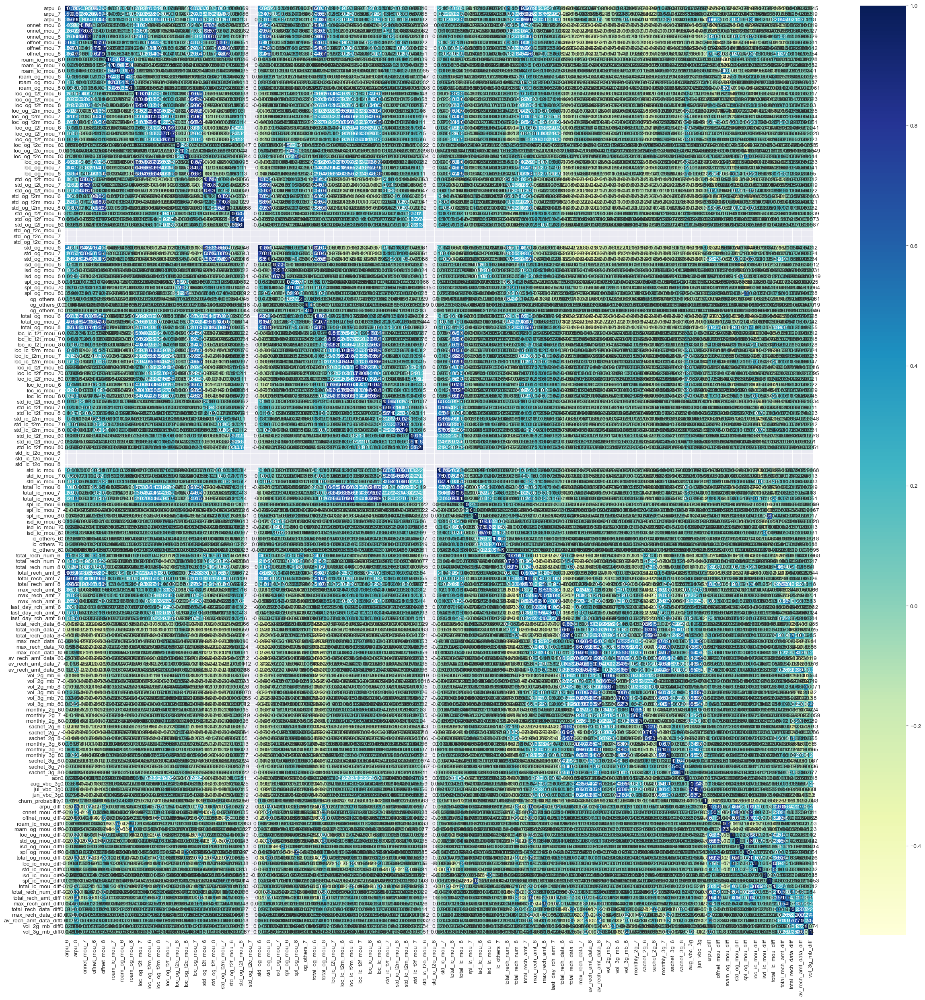

In [62]:
# Let's check the correlation coefficients to see which variables are highly correlated
plt.figure(figsize = (30, 30))
sns.heatmap(cor, annot = True, cmap="YlGnBu")
plt.show();

----

## Model Building and Prediction:

In [63]:
# import required libraries
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import FeatureUnion
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
#from imblearn.metrics import sensitivity_specificity_support

In [64]:
telchurn_churn_filtered['churn_probability'] = pd.to_numeric(telchurn_churn_filtered['churn_probability'])

In [65]:
X = telchurn_churn_filtered.drop("churn_probability", axis = 1)
y = telchurn_churn_filtered.churn_probability
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 4, stratify = y)

In [66]:
X_train.shape, y_train.shape

((15759, 168), (15759,))

In [67]:
X_test.shape, y_test.shape

((5254, 168), (5254,))

### <ins>Aggregating the categorical columns:</ins>

In [68]:
# aggregate the categorical variables
train = pd.concat([X_train, y_train], axis=1)

In [69]:
train.groupby('night_pck_user_6').churn_probability.mean(), \
train.groupby('night_pck_user_7').churn_probability.mean(), \
train.groupby('night_pck_user_8').churn_probability.mean()

(night_pck_user_6
 -1.0    0.091037
  0.0    0.061534
  1.0    0.110355
 Name: churn_probability, dtype: float64,
 night_pck_user_7
 -1.0    0.106008
  0.0    0.051774
  1.0    0.049518
 Name: churn_probability, dtype: float64,
 night_pck_user_8
 -1.0    0.129077
  0.0    0.027976
  1.0    0.019661
 Name: churn_probability, dtype: float64)

In [70]:
train.groupby('fb_user_6').churn_probability.mean(), \
train.groupby('fb_user_7').churn_probability.mean(), \
train.groupby('fb_user_8').churn_probability.mean()

(fb_user_6
 -1.0    0.091037
  0.0    0.067671
  1.0    0.062284
 Name: churn_probability, dtype: float64,
 fb_user_7
 -1.0    0.106008
  0.0    0.059332
  1.0    0.051071
 Name: churn_probability, dtype: float64,
 fb_user_8
 -1.0    0.129077
  0.0    0.071381
  1.0    0.022682
 Name: churn_probability, dtype: float64)

In [71]:
mapping = {'night_pck_user_6' : {-1:  0.091037, 0: 0.061534, 1: 0.110355},
           'night_pck_user_7' : {-1: 0.106008, 0: 0.051774, 1: 0.049518},
           'night_pck_user_8' : {-1: 0.129077, 0: 0.027976, 1: 0.019661},
           'fb_user_6'        : {-1: 0.091037, 0: 0.067671, 1: 0.062284},
           'fb_user_7'        : {-1: 0.106008, 0: 0.059332, 1: 0.051071},
           'fb_user_8'        : {-1: 0.129077, 0: 0.071381, 1: 0.022682}
          }
X_train.replace(mapping, inplace = True)
X_test.replace(mapping, inplace = True)

In [72]:
cat_X_train = [col for col in cat_cols if col not in ['telchurn']]
X_train[cat_X_train].info()

<class 'pandas.core.frame.DataFrame'>
Index: 15759 entries, 13528 to 20561
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   night_pck_user_6  15759 non-null  float64
 1   night_pck_user_7  15759 non-null  float64
 2   night_pck_user_8  15759 non-null  float64
 3   fb_user_6         15759 non-null  float64
 4   fb_user_7         15759 non-null  float64
 5   fb_user_8         15759 non-null  float64
dtypes: float64(6)
memory usage: 861.8 KB


In [73]:
X_train.shape

(15759, 168)

------

## PCA - Principal component analysis:

In [74]:
pca = Pipeline([('scaler', StandardScaler()), ('pca', PCA())])
pca.fit(X_train)
churn_pca = pca.fit_transform(X_train)
# extract pca model from pipeline
pca = pca.named_steps['pca']

# look at explainded variance of PCA components
print(pd.Series(np.round(pca.explained_variance_ratio_.cumsum(), 4)*100))

0       11.58
1       21.06
2       26.97
3       31.94
4       35.97
        ...  
163    100.00
164    100.00
165    100.00
166    100.00
167    100.00
Length: 168, dtype: float64


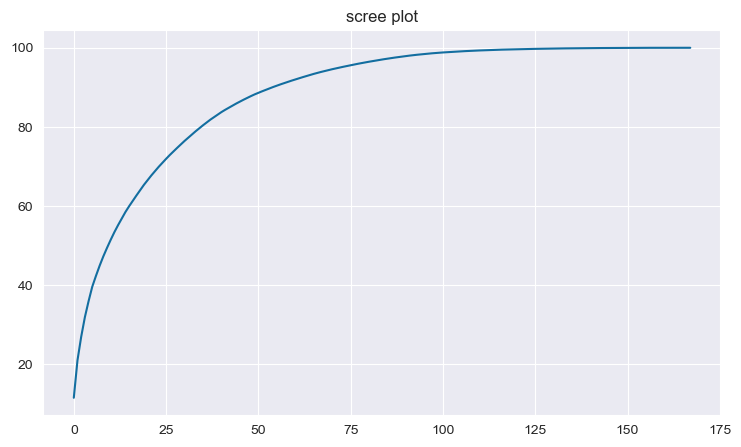

In [75]:
features = range(pca.n_components_)
cumulative_variance = np.round(np.cumsum(pca.explained_variance_ratio_)*100, decimals=4)

# 100 elements on y-axis; 175 elements on x-axis; 20 is normalising factor
plt.figure(figsize=(175/20,100/20)) 
plt.plot(cumulative_variance)
plt.title('scree plot');


---

## PCA and Logistic Regression:

In [76]:
PCA_VARS = 60
steps = [('scaler', StandardScaler()),
         ("pca", PCA(n_components=PCA_VARS)),
         ("logistic", LogisticRegression(class_weight='balanced'))
        ]
pipeline = Pipeline(steps)

In [77]:
y_train=y_train.round()
pipeline.fit(X_train, y_train)

# check score on train data
pipeline.score(X_train, y_train)

0.8243543372041373

In [78]:
X_train.shape

(15759, 168)

---

## Evaluate on test data:

In [79]:
y_test=y_test.round()
y_pred = pipeline.predict(X_test)

# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

# check sensitivity and specificity
# sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred, average='binary')
# print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

# check area under curve
y_pred_prob = pipeline.predict_proba(X_test)[:, 1]
print("AUC:    \t", round(roc_auc_score(y_test, y_pred_prob),2))

[[3927  892]
 [  80  355]]
AUC:    	 0.89


In [80]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.98      0.81      0.89      4819
         1.0       0.28      0.82      0.42       435

    accuracy                           0.81      5254
   macro avg       0.63      0.82      0.66      5254
weighted avg       0.92      0.81      0.85      5254



## Perform testing on `test.csv`, kaggle file:

In [81]:
X_test_sub = pd.read_csv("test.csv")
X_test_sub.shape

(30000, 171)

In [82]:
X_test_sub.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,...,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
0,69999,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,91.882,65.330,...,0,0,0,NaN,NaN,NaN,1692,0.00,0.00,0.00
1,70000,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,414.168,515.568,...,0,0,0,NaN,NaN,NaN,2533,0.00,0.00,0.00
2,70001,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,329.844,434.884,...,0,0,0,NaN,NaN,NaN,277,525.61,758.41,241.84
3,70002,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,43.550,171.390,...,0,0,0,NaN,NaN,NaN,1244,0.00,0.00,0.00
4,70003,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,306.854,406.289,...,0,0,0,NaN,NaN,NaN,462,0.00,0.00,0.00


In [83]:
final_col=list(X_train.columns)
len(final_col)

168

In [84]:
print(final_col)

['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'lo

In [85]:
adn_col =[]
for col in final_col:
    if col not in list(X_test_sub.columns):
        adn_col.append(col)

len(adn_col)

23

In [86]:
del_col =[]
for col in X_test_sub.columns:
    if col not in final_col:
        del_col.append(col)

In [87]:
X_test_sub = X_test_sub.drop(del_col, axis=1)
len(X_test_sub.columns)

145

In [88]:
X_test_sub['arpu_diff'] = X_test_sub.arpu_8 - ((X_test_sub.arpu_6 + X_test_sub.arpu_7)/2)
X_test_sub['onnet_mou_diff'] = X_test_sub.onnet_mou_8 - ((X_test_sub.onnet_mou_6 + X_test_sub.onnet_mou_7)/2)
X_test_sub['offnet_mou_diff'] = X_test_sub.offnet_mou_8 - ((X_test_sub.offnet_mou_6 + X_test_sub.offnet_mou_7)/2)
X_test_sub['roam_ic_mou_diff'] = X_test_sub.roam_ic_mou_8 - ((X_test_sub.roam_ic_mou_6 + X_test_sub.roam_ic_mou_7)/2)
X_test_sub['roam_og_mou_diff'] = X_test_sub.roam_og_mou_8 - ((X_test_sub.roam_og_mou_6 + X_test_sub.roam_og_mou_7)/2)
X_test_sub['loc_og_mou_diff'] = X_test_sub.loc_og_mou_8 - ((X_test_sub.loc_og_mou_6 + X_test_sub.loc_og_mou_7)/2)
X_test_sub['std_og_mou_diff'] = X_test_sub.std_og_mou_8 - ((X_test_sub.std_og_mou_6 + X_test_sub.std_og_mou_7)/2)
X_test_sub['isd_og_mou_diff'] = X_test_sub.isd_og_mou_8 - ((X_test_sub.isd_og_mou_6 + X_test_sub.isd_og_mou_7)/2)
X_test_sub['spl_og_mou_diff'] = X_test_sub.spl_og_mou_8 - ((X_test_sub.spl_og_mou_6 + X_test_sub.spl_og_mou_7)/2)
X_test_sub['total_og_mou_diff'] = X_test_sub.total_og_mou_8 - ((X_test_sub.total_og_mou_6 + X_test_sub.total_og_mou_7)/2)
X_test_sub['loc_ic_mou_diff'] = X_test_sub.loc_ic_mou_8 - ((X_test_sub.loc_ic_mou_6 + X_test_sub.loc_ic_mou_7)/2)
X_test_sub['std_ic_mou_diff'] = X_test_sub.std_ic_mou_8 - ((X_test_sub.std_ic_mou_6 + X_test_sub.std_ic_mou_7)/2)
X_test_sub['isd_ic_mou_diff'] = X_test_sub.isd_ic_mou_8 - ((X_test_sub.isd_ic_mou_6 + X_test_sub.isd_ic_mou_7)/2)
X_test_sub['spl_ic_mou_diff'] = X_test_sub.spl_ic_mou_8 - ((X_test_sub.spl_ic_mou_6 + X_test_sub.spl_ic_mou_7)/2)
X_test_sub['total_ic_mou_diff'] = X_test_sub.total_ic_mou_8 - ((X_test_sub.total_ic_mou_6 + X_test_sub.total_ic_mou_7)/2)
X_test_sub['total_rech_num_diff'] = X_test_sub.total_rech_num_8 - ((X_test_sub.total_rech_num_6 + X_test_sub.total_rech_num_7)/2)
X_test_sub['total_rech_amt_diff'] = X_test_sub.total_rech_amt_8 - ((X_test_sub.total_rech_amt_6 + X_test_sub.total_rech_amt_7)/2)
X_test_sub['max_rech_amt_diff'] = X_test_sub.max_rech_amt_8 - ((X_test_sub.max_rech_amt_6 + X_test_sub.max_rech_amt_7)/2)
X_test_sub['total_rech_data_diff'] = X_test_sub.total_rech_data_8 - ((X_test_sub.total_rech_data_6 + X_test_sub.total_rech_data_7)/2)
X_test_sub['max_rech_data_diff'] = X_test_sub.max_rech_data_8 - ((X_test_sub.max_rech_data_6 + X_test_sub.max_rech_data_7)/2)
X_test_sub['av_rech_amt_data_diff'] = X_test_sub.av_rech_amt_data_8 - ((X_test_sub.av_rech_amt_data_6 + X_test_sub.av_rech_amt_data_7)/2)
X_test_sub['vol_2g_mb_diff'] = X_test_sub.vol_2g_mb_8 - ((X_test_sub.vol_2g_mb_6 + X_test_sub.vol_2g_mb_7)/2)
X_test_sub['vol_3g_mb_diff'] = X_test_sub.vol_3g_mb_8 - ((X_test_sub.vol_3g_mb_6 + X_test_sub.vol_3g_mb_7)/2)

In [89]:
X_test_sub.shape, X_train.shape

((30000, 168), (15759, 168))

In [90]:
X_train

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,...,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
13528,559.135,508.842,553.107,597.83,448.53,594.29,149.26,175.73,299.99,4.180000,...,0.00,-61.735,-1.0,45.0,31.0,0.0,0.0,0.0,0.000,0.000
7183,381.035,660.847,199.111,364.79,617.33,51.71,124.69,258.86,40.08,0.000000,...,0.00,-139.375,-18.0,-438.0,7.0,0.0,0.0,0.0,0.000,0.000
14666,276.101,518.185,267.706,84.68,117.61,87.43,552.86,510.43,383.46,0.000000,...,0.00,-312.175,-2.0,-196.0,17.5,0.0,0.0,0.0,21.065,-156.810
17922,413.743,476.101,409.262,636.51,728.43,700.23,177.04,137.53,162.48,0.000000,...,0.00,-30.925,0.5,76.0,20.0,0.0,0.0,0.0,0.000,0.000
5165,497.504,444.456,293.627,739.41,185.51,66.08,481.24,673.68,534.98,0.000000,...,0.00,-28.100,-6.5,-201.0,20.0,0.0,0.0,0.0,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10248,593.710,176.365,468.511,319.28,6.16,41.21,191.86,227.69,467.46,248.466563,...,0.00,42.745,-2.5,136.0,35.0,-0.5,0.0,-72.5,-14.460,-571.775
6594,795.701,1075.717,820.655,1208.24,1380.31,1310.78,245.46,782.89,478.08,0.000000,...,0.00,-122.420,-20.0,7.5,61.5,0.0,0.0,0.0,0.000,0.000
492,407.097,488.824,260.994,107.61,142.88,77.16,446.93,483.16,195.24,0.000000,...,-0.13,-240.415,0.0,-186.0,-40.0,0.0,0.0,0.0,0.000,0.000
19099,490.151,441.268,393.735,337.76,218.16,396.83,427.83,403.36,229.94,0.000000,...,0.00,34.625,-4.5,-75.5,0.0,-1.0,-8.5,-15.5,-54.400,0.000


In [91]:
X_test_sub

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,...,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
0,91.882,65.330,64.445,31.78,20.23,23.11,60.16,32.16,34.83,0.00,...,-0.05,-6.385,-1.0,-36.5,-10.0,NaN,NaN,NaN,0.000,0.000
1,414.168,515.568,360.868,75.51,41.21,19.84,474.34,621.84,394.94,0.00,...,0.00,-36.325,0.5,0.0,0.0,NaN,NaN,NaN,0.000,0.000
2,329.844,434.884,746.239,7.54,7.86,8.40,16.98,45.81,45.04,22.81,...,0.00,0.000,-2.5,250.0,100.0,NaN,NaN,NaN,0.000,0.000
3,43.550,171.390,24.400,5.31,2.16,0.00,40.04,205.01,24.01,0.00,...,0.00,10.065,-2.0,-185.0,-130.0,NaN,NaN,NaN,0.000,0.000
4,306.854,406.289,413.329,450.93,609.03,700.68,60.94,23.84,74.16,0.00,...,0.00,74.430,-1.0,123.0,20.0,NaN,NaN,NaN,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,718.870,396.259,406.150,324.46,250.01,285.41,190.36,166.14,221.96,87.76,...,0.00,199.105,-3.0,-174.0,-4.5,NaN,NaN,NaN,-10.990,-22.535
29996,218.327,324.070,374.981,263.79,467.24,650.26,108.53,124.11,189.76,3.40,...,0.00,38.470,1.0,188.5,69.5,NaN,NaN,NaN,0.000,0.000
29997,139.473,38.230,180.194,11.08,14.89,19.94,37.24,16.74,45.28,0.00,...,0.00,6.160,5.5,165.0,25.0,NaN,NaN,NaN,0.000,0.000
29998,1122.912,781.121,257.439,122.74,50.23,26.46,1854.09,1088.83,306.16,0.00,...,0.00,-27.575,-25.0,-774.0,-38.0,NaN,NaN,NaN,0.000,0.000


In [92]:
X_test_sub.isna().any()

arpu_6                   False
arpu_7                   False
arpu_8                   False
onnet_mou_6               True
onnet_mou_7               True
                         ...  
total_rech_data_diff      True
max_rech_data_diff        True
av_rech_amt_data_diff     True
vol_2g_mb_diff           False
vol_3g_mb_diff           False
Length: 168, dtype: bool

In [93]:
nan_test_list = X_test_sub.columns[X_test_sub.isna().any()].tolist()
for i in nan_test_list:
    X_test_sub[i] = X_test_sub[i].fillna(0)

In [94]:
X_test_sub.isna().any()

arpu_6                   False
arpu_7                   False
arpu_8                   False
onnet_mou_6              False
onnet_mou_7              False
                         ...  
total_rech_data_diff     False
max_rech_data_diff       False
av_rech_amt_data_diff    False
vol_2g_mb_diff           False
vol_3g_mb_diff           False
Length: 168, dtype: bool

In [95]:
mapping = {'night_pck_user_6' : {-1:  0.091037, 0: 0.061534, 1: 0.110355},
           'night_pck_user_7' : {-1: 0.106008, 0: 0.051774, 1: 0.049518},
           'night_pck_user_8' : {-1: 0.129077, 0: 0.027976, 1: 0.019661},
           'fb_user_6'        : {-1: 0.091037, 0: 0.067671, 1: 0.062284},
           'fb_user_7'        : {-1: 0.106008, 0: 0.059332, 1: 0.051071},
           'fb_user_8'        : {-1: 0.129077, 0: 0.071381, 1: 0.022682}
          }
#X_train.replace(mapping, inplace = True)
X_test_sub.replace(mapping, inplace = True)

In [96]:
y_pred = pipeline.predict(X_test_sub)

In [97]:
X_test_sub.shape

(30000, 168)

In [98]:
len(y_pred)

30000

In [99]:
id = range(69999, 69999+30000)
len(id)

30000

----

## Hyperparameter tuning - PCA and Logistic Regression:

In [100]:
y_train.value_counts()/y_train.shape

churn_probability
0.0    0.917254
1.0    0.082746
Name: count, dtype: float64

In [101]:
# PCA
pca = PCA()

# logistic regression - the class weight is used to handle class imbalance - it adjusts the cost function
logistic = LogisticRegression(class_weight={0:0.1, 1: 0.9})

# create pipeline
steps = [("scaler", StandardScaler()), 
         ("pca", pca),
         ("logistic", logistic)
        ]

# compile pipeline
pca_logistic = Pipeline(steps)

# hyperparameter space
params = {'pca__n_components': [60, 80], 'logistic__C': [0.1, 0.5, 1, 2, 3, 4, 5, 10], 'logistic__penalty': ['l1', 'l2']}

# create 5 folds
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

# create gridsearch object
model = GridSearchCV(estimator=pca_logistic, cv=folds, param_grid=params, scoring='roc_auc', n_jobs=-1, verbose=1)

In [102]:
# fit model
model.fit(X_train, y_train)

Fitting 5 folds for each of 32 candidates, totalling 160 fits


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('pca', PCA()),
                                       ('logistic',
                                        LogisticRegression(class_weight={0: 0.1,
                                                                         1: 0.9}))]),
             n_jobs=-1,
             param_grid={'logistic__C': [0.1, 0.5, 1, 2, 3, 4, 5, 10],
                         'logistic__penalty': ['l1', 'l2'],
                         'pca__n_components': [60, 80]},
             scoring='roc_auc', verbose=1)

In [103]:
telchurn_result = pd.DataFrame(model.cv_results_) 

In [104]:
print("Best AUC: ", model.best_score_)
print("Best hyperparameters: ", model.best_params_)

Best AUC:  0.8983249111060749
Best hyperparameters:  {'logistic__C': 0.1, 'logistic__penalty': 'l2', 'pca__n_components': 80}


In [105]:
# predict churn on test data
y_pred = model.predict(X_test)

# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

# check sensitivity and specificity
# sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred, average='binary')
# print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

# check area under curve
y_pred_prob = model.predict_proba(X_test)[:, 1]
print("AUC:    \t", round(roc_auc_score(y_test, y_pred_prob),2))

[[4086  733]
 [  85  350]]
AUC:    	 0.89


In [106]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.98      0.85      0.91      4819
         1.0       0.32      0.80      0.46       435

    accuracy                           0.84      5254
   macro avg       0.65      0.83      0.69      5254
weighted avg       0.93      0.84      0.87      5254



------

## Random Forest model:

In [107]:
X_train.columns

Index(['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7',
       'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8',
       'roam_ic_mou_6',
       ...
       'spl_ic_mou_diff', 'total_ic_mou_diff', 'total_rech_num_diff',
       'total_rech_amt_diff', 'max_rech_amt_diff', 'total_rech_data_diff',
       'max_rech_data_diff', 'av_rech_amt_data_diff', 'vol_2g_mb_diff',
       'vol_3g_mb_diff'],
      dtype='object', length=168)

In [108]:
# random forest - the class weight is used to handle class imbalance - it adjusts the cost function
forest = RandomForestClassifier(class_weight={0:0.1, 1: 0.9}, n_jobs = -1)

# hyperparameter space
params = {"criterion": ['gini', 'entropy'], "max_features": ['auto', 0.4]}

# create 5 folds
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

# create gridsearch object
model = GridSearchCV(estimator=forest, cv=folds, param_grid=params, scoring='roc_auc', n_jobs=-1, verbose=1)

In [109]:
model.fit(X_train, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


/Users/mit/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/mit/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/mit/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also t

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             estimator=RandomForestClassifier(class_weight={0: 0.1, 1: 0.9},
                                              n_jobs=-1),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_features': ['auto', 0.4]},
             scoring='roc_auc', verbose=1)

In [110]:
# print best hyperparameters
print("Best AUC: ", model.best_score_)
print("Best hyperparameters: ", model.best_params_)

Best AUC:  0.9272721026248621
Best hyperparameters:  {'criterion': 'entropy', 'max_features': 'auto'}


In [111]:
y_pred = model.predict(X_test)

# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

# check sensitivity and specificity

# check area under curve
y_pred_prob = model.predict_proba(X_test)[:, 1]
print("AUC:    \t", round(roc_auc_score(y_test, y_pred_prob),2))

[[4744   75]
 [ 239  196]]
AUC:    	 0.93


In [112]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.95      0.98      0.97      4819
         1.0       0.72      0.45      0.56       435

    accuracy                           0.94      5254
   macro avg       0.84      0.72      0.76      5254
weighted avg       0.93      0.94      0.93      5254



### Perform testing on `test.csv`, kaggle file for Random forest:

In [113]:
X_test_sub = pd.read_csv("test.csv")
X_test_sub.shape
final_col=list(X_train.columns)
print(final_col)

['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'lo

In [114]:
len(final_col)

168

In [115]:
adn_col =[]
for col in final_col:
    if col not in list(X_test_sub.columns):
        adn_col.append(col)
len(adn_col)

23

In [116]:
del_col =[]
for col in X_test_sub.columns:
    if col not in final_col:
        del_col.append(col)
X_test_sub = X_test_sub.drop(del_col, axis=1)

len(X_test_sub.columns)

145

In [117]:
X_test_sub['arpu_diff'] = X_test_sub.arpu_8 - ((X_test_sub.arpu_6 + X_test_sub.arpu_7)/2)
X_test_sub['onnet_mou_diff'] = X_test_sub.onnet_mou_8 - ((X_test_sub.onnet_mou_6 + X_test_sub.onnet_mou_7)/2)
X_test_sub['offnet_mou_diff'] = X_test_sub.offnet_mou_8 - ((X_test_sub.offnet_mou_6 + X_test_sub.offnet_mou_7)/2)
X_test_sub['roam_ic_mou_diff'] = X_test_sub.roam_ic_mou_8 - ((X_test_sub.roam_ic_mou_6 + X_test_sub.roam_ic_mou_7)/2)
X_test_sub['roam_og_mou_diff'] = X_test_sub.roam_og_mou_8 - ((X_test_sub.roam_og_mou_6 + X_test_sub.roam_og_mou_7)/2)
X_test_sub['loc_og_mou_diff'] = X_test_sub.loc_og_mou_8 - ((X_test_sub.loc_og_mou_6 + X_test_sub.loc_og_mou_7)/2)
X_test_sub['std_og_mou_diff'] = X_test_sub.std_og_mou_8 - ((X_test_sub.std_og_mou_6 + X_test_sub.std_og_mou_7)/2)
X_test_sub['isd_og_mou_diff'] = X_test_sub.isd_og_mou_8 - ((X_test_sub.isd_og_mou_6 + X_test_sub.isd_og_mou_7)/2)
X_test_sub['spl_og_mou_diff'] = X_test_sub.spl_og_mou_8 - ((X_test_sub.spl_og_mou_6 + X_test_sub.spl_og_mou_7)/2)
X_test_sub['total_og_mou_diff'] = X_test_sub.total_og_mou_8 - ((X_test_sub.total_og_mou_6 + X_test_sub.total_og_mou_7)/2)
X_test_sub['loc_ic_mou_diff'] = X_test_sub.loc_ic_mou_8 - ((X_test_sub.loc_ic_mou_6 + X_test_sub.loc_ic_mou_7)/2)
X_test_sub['std_ic_mou_diff'] = X_test_sub.std_ic_mou_8 - ((X_test_sub.std_ic_mou_6 + X_test_sub.std_ic_mou_7)/2)
X_test_sub['isd_ic_mou_diff'] = X_test_sub.isd_ic_mou_8 - ((X_test_sub.isd_ic_mou_6 + X_test_sub.isd_ic_mou_7)/2)
X_test_sub['spl_ic_mou_diff'] = X_test_sub.spl_ic_mou_8 - ((X_test_sub.spl_ic_mou_6 + X_test_sub.spl_ic_mou_7)/2)
X_test_sub['total_ic_mou_diff'] = X_test_sub.total_ic_mou_8 - ((X_test_sub.total_ic_mou_6 + X_test_sub.total_ic_mou_7)/2)
X_test_sub['total_rech_num_diff'] = X_test_sub.total_rech_num_8 - ((X_test_sub.total_rech_num_6 + X_test_sub.total_rech_num_7)/2)
X_test_sub['total_rech_amt_diff'] = X_test_sub.total_rech_amt_8 - ((X_test_sub.total_rech_amt_6 + X_test_sub.total_rech_amt_7)/2)
X_test_sub['max_rech_amt_diff'] = X_test_sub.max_rech_amt_8 - ((X_test_sub.max_rech_amt_6 + X_test_sub.max_rech_amt_7)/2)
X_test_sub['total_rech_data_diff'] = X_test_sub.total_rech_data_8 - ((X_test_sub.total_rech_data_6 + X_test_sub.total_rech_data_7)/2)
X_test_sub['max_rech_data_diff'] = X_test_sub.max_rech_data_8 - ((X_test_sub.max_rech_data_6 + X_test_sub.max_rech_data_7)/2)
X_test_sub['av_rech_amt_data_diff'] = X_test_sub.av_rech_amt_data_8 - ((X_test_sub.av_rech_amt_data_6 + X_test_sub.av_rech_amt_data_7)/2)
X_test_sub['vol_2g_mb_diff'] = X_test_sub.vol_2g_mb_8 - ((X_test_sub.vol_2g_mb_6 + X_test_sub.vol_2g_mb_7)/2)
X_test_sub['vol_3g_mb_diff'] = X_test_sub.vol_3g_mb_8 - ((X_test_sub.vol_3g_mb_6 + X_test_sub.vol_3g_mb_7)/2)

In [118]:
X_test_sub.shape

(30000, 168)

In [119]:
X_test_sub.isna().any()

arpu_6                   False
arpu_7                   False
arpu_8                   False
onnet_mou_6               True
onnet_mou_7               True
                         ...  
total_rech_data_diff      True
max_rech_data_diff        True
av_rech_amt_data_diff     True
vol_2g_mb_diff           False
vol_3g_mb_diff           False
Length: 168, dtype: bool

In [120]:
nan_test_list = X_test_sub.columns[X_test_sub.isna().any()].tolist()
for i in nan_test_list:
    X_test_sub[i] = X_test_sub[i].fillna(0)

In [121]:
X_test_sub.isna().any()

arpu_6                   False
arpu_7                   False
arpu_8                   False
onnet_mou_6              False
onnet_mou_7              False
                         ...  
total_rech_data_diff     False
max_rech_data_diff       False
av_rech_amt_data_diff    False
vol_2g_mb_diff           False
vol_3g_mb_diff           False
Length: 168, dtype: bool

In [122]:
mapping = {'night_pck_user_6' : {-1:  0.091037, 0: 0.061534, 1: 0.110355},
           'night_pck_user_7' : {-1: 0.106008, 0: 0.051774, 1: 0.049518},
           'night_pck_user_8' : {-1: 0.129077, 0: 0.027976, 1: 0.019661},
           'fb_user_6'        : {-1: 0.091037, 0: 0.067671, 1: 0.062284},
           'fb_user_7'        : {-1: 0.106008, 0: 0.059332, 1: 0.051071},
           'fb_user_8'        : {-1: 0.129077, 0: 0.071381, 1: 0.022682}
          }
#X_train.replace(mapping, inplace = True)
X_test_sub.replace(mapping, inplace = True)

In [123]:
y_pred = model.predict(X_test_sub)

In [124]:
telchurn_res = pd.DataFrame(
    {'id': id,
     'churn_probability': y_pred
     
    })
telchurn_res['churn_probability'] = telchurn_res['churn_probability'].astype(int)

**Exporting the csv file for Kaggle submissioon:**

In [125]:
telchurn_res.to_csv("Submission.csv", index = False)

---------

## Choosing best features:

In [126]:
# run a random forest model on train data
max_features = int(round(np.sqrt(X_train.shape[1])))    # number of variables to consider to split each node
print(max_features)

13


In [127]:
rf_model = RandomForestClassifier(n_estimators=100, 
                                  max_features=max_features, 
                                  class_weight={0:0.1, 1: 0.9}, 
                                  oob_score=True, 
                                  random_state=4, 
                                  verbose=1)

In [128]:
# fit model
rf_model.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    3.6s


RandomForestClassifier(class_weight={0: 0.1, 1: 0.9}, max_features=13,
                       oob_score=True, random_state=4, verbose=1)

In [129]:
rf_model.oob_score_

0.9429532330731646

In [130]:
# predict churn on test data
y_pred = rf_model.predict(X_test)

# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

# check sensitivity and specificity
# sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred, average='binary')
# print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

# check area under curve
y_pred_prob = rf_model.predict_proba(X_test)[:, 1]
print("ROC:    \t", round(roc_auc_score(y_test, y_pred_prob),2))

print(classification_report(y_test, y_pred))

[[4746   73]
 [ 238  197]]
ROC:    	 0.93
              precision    recall  f1-score   support

         0.0       0.95      0.98      0.97      4819
         1.0       0.73      0.45      0.56       435

    accuracy                           0.94      5254
   macro avg       0.84      0.72      0.76      5254
weighted avg       0.93      0.94      0.93      5254



[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s


------

## Feature Importance:

In [131]:
# predictors
features = telchurn_churn_filtered.drop('churn_probability', axis=1).columns

# feature_importance
importance = rf_model.feature_importances_

# create dataframe
feature_importance = pd.DataFrame({'variables': features, 'importance_percentage': importance*100})
feature_importance = feature_importance[['variables', 'importance_percentage']]

# sort features
feature_importance = feature_importance.sort_values('importance_percentage', ascending=False).reset_index(drop=True)
print("Sum of importance=", feature_importance.importance_percentage.sum())
feature_importance

Sum of importance= 100.00000000000003


,variables,importance_percentage
0,loc_ic_mou_8,5.748039
1,total_ic_mou_8,5.486327
2,loc_og_t2m_mou_8,3.653881
3,loc_ic_t2m_mou_8,3.571109
4,loc_og_mou_8,2.795425
...,...,...
163,std_ic_t2o_mou_8,0.000000
164,std_og_t2c_mou_6,0.000000
165,std_og_t2c_mou_7,0.000000
166,std_og_t2c_mou_8,0.000000


### Extracting top 30 features:

In [132]:
top_n = 30
top_features = feature_importance.variables[0:top_n]

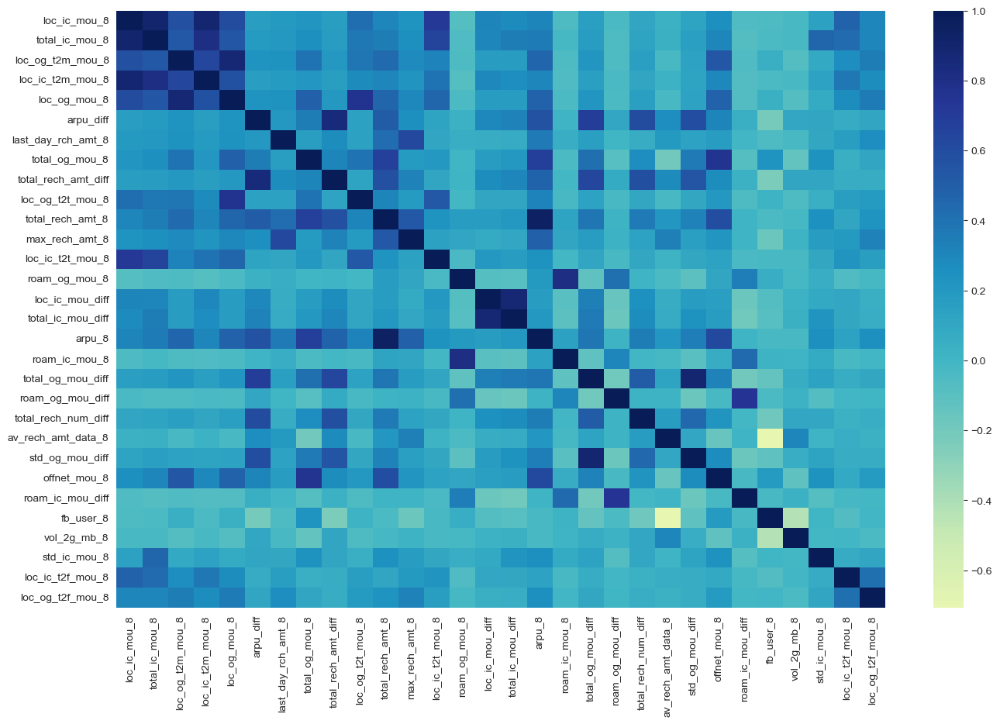

In [133]:
import seaborn as sns
plt.rcParams["figure.figsize"] =(16,10)
sns.heatmap(data=X_train[top_features].corr(), center=0.0, cmap="YlGnBu");

### Top Features:

In [134]:
top_features_10 = top_features[0:9]

X_train = X_train[top_features_10]
X_test = X_test[top_features_10]

In [135]:
# logistic regression
steps = [('scaler', StandardScaler()), 
         ("logistic", LogisticRegression(class_weight={0:0.1, 1:0.9}))
        ]

# compile pipeline
logistic = Pipeline(steps)

# hyperparameter space
params = {'logistic__C': [0.1, 0.5, 1, 2, 3, 4, 5, 10], 'logistic__penalty': ['l1', 'l2']}

# create 5 folds
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

# create gridsearch object
model = GridSearchCV(estimator=logistic, cv=folds, param_grid=params, scoring='roc_auc', n_jobs=-1, verbose=1)

In [136]:
# fit model
model.fit(X_train, y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('logistic',
                                        LogisticRegression(class_weight={0: 0.1,
                                                                         1: 0.9}))]),
             n_jobs=-1,
             param_grid={'logistic__C': [0.1, 0.5, 1, 2, 3, 4, 5, 10],
                         'logistic__penalty': ['l1', 'l2']},
             scoring='roc_auc', verbose=1)

In [137]:
print("Best AUC: ", model.best_score_)
print("Best hyperparameters: ", model.best_params_)

Best AUC:  0.870941852021421
Best hyperparameters:  {'logistic__C': 10, 'logistic__penalty': 'l2'}


In [138]:
# predict churn on test data
y_pred = model.predict(X_test)

# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)


y_pred_prob = model.predict_proba(X_test)[:, 1]
print("ROC:    \t", round(roc_auc_score(y_test, y_pred_prob),2))

[[3964  855]
 [ 100  335]]
ROC:    	 0.85


In [139]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.98      0.82      0.89      4819
         1.0       0.28      0.77      0.41       435

    accuracy                           0.82      5254
   macro avg       0.63      0.80      0.65      5254
weighted avg       0.92      0.82      0.85      5254



-------

## Extraction of the intercept and the coefficients from the logistic model:

In [140]:
logistic_model = model.best_estimator_.named_steps['logistic']
# intercept
intercept_telchurn = pd.DataFrame(logistic_model.intercept_.reshape((1,1)), columns = ['intercept'])
# coefficients
coefficients = logistic_model.coef_.reshape(9, 1).tolist()
coefficients = [val for sublist in coefficients for val in sublist]
coefficients = [round(coefficient, 3) for coefficient in coefficients]

logistic_features = list(X_train.columns)
coefficients_telchurn = pd.DataFrame(logistic_model.coef_, columns=logistic_features)
# concatenate dataframes
coefficients = pd.concat([intercept_telchurn, coefficients_telchurn], axis=1)
coefficients

,intercept,loc_ic_mou_8,total_ic_mou_8,loc_og_t2m_mou_8,loc_ic_t2m_mou_8,loc_og_mou_8,arpu_diff,last_day_rch_amt_8,total_og_mou_8,total_rech_amt_diff
0,-1.490875,-0.680075,-0.482281,-0.258217,-0.425098,-0.084777,-0.287468,-0.222731,-0.01796,-0.58333


-----

## Business Insights:

- To reduce the customer churning, businees should reduce the tariff for local outgoing calls per minute and come up with new  std+local combo  packages.
- To improve the average revenue spent by the customershe business should give  attractive offers.
- The prediction can be used to take steps towards retaining customer paying high values incase there is any probability of them being churn.
- Maximum churn happens in first 6 months hence such customers should be focused.
- Customers with lower outgoing calls in 8th month are at higher risk of being churn. Hence such customers need to be given attention.
- Customers with low arpu(average revenue per user) should be focused as there is high possibility for them being churn 
- roaming usage incoming and outgoing seems to be important predictors of churn. Company can think of lowering rates for roaming usage.
- local incoming calls within same operator is the most important predictor of being churn and company can make this service free to compete with other competitors and retain customers.
- total recharge amount is also one of the good indicator of churn and company can provide discounts on recharge.

----

## `Credentials:`
===================

Please find the contributors details below:

> **<ins>Primary Author:</ins>**
> + Name: Souhardya Biswas 
> + Phone no: +91 9749207386 
> + Email ID: souhardyabiswas02@gmail.com 


----